In [2]:
import pandas as pd
import seaborn as sns
import folium
from scipy import stats

from zipfile import ZipFile

In [42]:
c = 'ACCIDENT.zip'
files = ZipFile(c)
foo = pd.read_csv(files.open('VEHICLE.csv'))
foo = foo[['ACCIDENT_NO', 'VEHICLE_YEAR_MANUF']]
foo.drop(foo[foo['VEHICLE_YEAR_MANUF'] < 1900].index, inplace=True)
foo = foo.groupby('ACCIDENT_NO').min().reset_index()

C:\Users\ym248989\.conda\envs\ailab\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning:

Columns (3,25,26,35,36) have mixed types.Specify dtype option on import or set low_memory=False.



In [43]:
dfs = []
for c in ['ACCIDENT.zip']:
    files = ZipFile(c)

    df = pd.read_csv(files.open("ACCIDENT.csv"))
    df['ACCIDENTTIME'] = ' ' + df['ACCIDENTTIME'].str.strip()
    if c == '2000 to 2005 ACCIDENT.zip':
        df['ACCIDENTTIME'] = df['ACCIDENTTIME'].str.replace('.',':')
    df['DATE'] = pd.to_datetime(df['ACCIDENTDATE'] + df['ACCIDENTTIME'])
    df['ACCIDENTYEAR'] = df['DATE'].dt.year
    df['ACCIDENTHOUR'] = df['DATE'].dt.hour

    df_node = pd.read_csv(files.open('NODE.csv')).drop_duplicates(subset=['ACCIDENT_NO'])

    df = df.merge(df_node[['ACCIDENT_NO', 'LGA_NAME', 'Lat', 'Long']],
        left_on='ACCIDENT_NO',right_on='ACCIDENT_NO', how='inner')

    foo = pd.read_csv(files.open('ROAD_SURFACE_COND.csv')).drop_duplicates(subset=['ACCIDENT_NO'])
    df = df.merge(foo[['ACCIDENT_NO', 'SURFACE_COND', 'Surface Cond Desc']], left_on='ACCIDENT_NO',right_on='ACCIDENT_NO', how='left')

    foo = pd.read_csv(files.open('ACCIDENT_LOCATION.csv'))
    df = df.merge(foo[['ACCIDENT_NO', 'ROAD_NAME', 'ROAD_TYPE', 'ROAD_NAME_INT', 'ROAD_TYPE_INT']], left_on='ACCIDENT_NO',right_on='ACCIDENT_NO', how='left')

    foo = pd.read_csv(files.open('VEHICLE.csv'))
    foo = foo[['ACCIDENT_NO', 'VEHICLE_YEAR_MANUF']]
    foo.drop(foo[foo['VEHICLE_YEAR_MANUF'] < 1900].index, inplace=True)
    foo = foo.groupby('ACCIDENT_NO').min().reset_index()
    df = df.merge(foo[['ACCIDENT_NO', 'VEHICLE_YEAR_MANUF']], left_on='ACCIDENT_NO',right_on='ACCIDENT_NO', how='left')

    foo = pd.read_csv(files.open('SUBDCA.csv'))
    foo = foo[['ACCIDENT_NO', 'Sub Dca Code Desc']]
    foo = foo.groupby('ACCIDENT_NO').agg(','.join).reset_index()
    df = df.merge(foo[['ACCIDENT_NO', 'Sub Dca Code Desc']], left_on='ACCIDENT_NO',right_on='ACCIDENT_NO', how='left')

    print(df.shape)
    dfs.append(df)
df = pd.concat(dfs)

select = ['ACCIDENT_NO', 'DATE', 'VEHICLE_YEAR_MANUF', 'Sub Dca Code Desc',
       'Accident Type Desc', 'Day Week Description',
       'DCA Description',  'Light Condition Desc',
       'NO_OF_VEHICLES', 'NO_PERSONS', 'NO_PERSONS_INJ_2',
       'NO_PERSONS_INJ_3', 'NO_PERSONS_KILLED', 'NO_PERSONS_NOT_INJ',
       'POLICE_ATTEND', 'Road Geometry Desc', 'SEVERITY',
       'SPEED_ZONE', 'ACCIDENTYEAR', 'ACCIDENTHOUR', 'LGA_NAME', 'Lat', 'Long',
       'Surface Cond Desc', 'ROAD_NAME', 'ROAD_TYPE',
       'ROAD_NAME_INT', 'ROAD_TYPE_INT']
df = df[select]

C:\Users\ym248989\.conda\envs\ailab\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning:

Columns (10,13) have mixed types.Specify dtype option on import or set low_memory=False.

C:\Users\ym248989\.conda\envs\ailab\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning:

Columns (3,25,26,35,36) have mixed types.Specify dtype option on import or set low_memory=False.



(202854, 42)


In [44]:
# Dummy variable
df['accident'] = 1

### Distribution of time between two severe accidents

count    3706.000000
mean       35.335942
std        38.282033
min         0.000000
25%         9.333333
50%        23.766667
75%        48.429167
max       521.333333
Name: DATE, dtype: float64


<AxesSubplot:xlabel='DATE', ylabel='Density'>

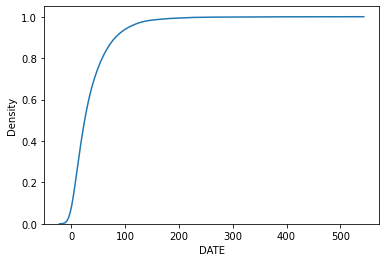

In [31]:
srt = df.sort_values('DATE')
ts = srt[srt.SEVERITY <= 1]['DATE']
dt_hours = (ts.shift(-1) - ts).dt.total_seconds()/3600
print(dt_hours.describe())
sns.kdeplot(
    dt_hours,
    cumulative=True, common_norm=False, common_grid=True,
)

### Histograms

In [32]:
import plotly.express as px
fig = px.histogram(df.sort_values('SEVERITY'), x="ACCIDENTYEAR", y="accident",
             color='SEVERITY', barmode='stack',
             height=400)
fig.show()

In [45]:
df.VEHICLE_YEAR_MANUF.unique()

array([1996., 1991., 1995., 1997., 1986., 1992., 2004., 1993., 1989.,
       1977.,   nan, 2002., 1976., 1988., 1990., 1998., 2005., 1982.,
       1984., 1980., 1978., 1999., 2001., 2000., 1981., 1987., 1994.,
       2003., 1979., 1973., 1983., 1970., 1985., 1971., 1974., 1969.,
       1965., 1962., 2006., 1905., 1955., 1967., 1975., 1934., 1961.,
       1964., 1972., 1968., 1966., 1957., 1959., 1900., 1952., 1956.,
       1960., 1940., 1936., 2007., 1954., 1951., 1958., 1904., 1963.,
       1930., 2008., 1949., 1937., 1928., 1933., 1922., 1932., 1941.,
       1948., 1950., 2009., 2010., 1911., 2011., 1929., 1939., 1927.,
       2012., 1926., 1938., 1909., 2013., 2014., 1935., 1918., 1923.,
       2015., 1913., 2016., 1925., 1910., 2017., 2018., 1947., 2019.,
       2020.])

In [46]:
pd.pivot_table(df[['ACCIDENTYEAR', 'VEHICLE_YEAR_MANUF', 'accident']],
    index='ACCIDENTYEAR',columns='VEHICLE_YEAR_MANUF', values='accident',
    aggfunc=sum
).fillna(0)

VEHICLE_YEAR_MANUF,1900.0,1904.0,1905.0,1909.0,1910.0,1911.0,1913.0,1918.0,1922.0,1923.0,...,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0,2020.0
ACCIDENTYEAR,,,,,,,,,,,,,,,,,,,,,
2006,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2007,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2008,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2009,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,144.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,349.0,148.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,420.0,442.0,137.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2014,8.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,493.0,453.0,440.0,148.0,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:
df[['Accident Type Desc', 'accident']].groupby('Accident Type Desc').sum().sort_values('accident')

,accident
Accident Type Desc,
Other accident,133
Fall from or in moving vehicle,1707
Struck animal,1858
collision with some other object,1926
Vehicle overturned (no collision),9212
No collision and no object struck,9575
Struck Pedestrian,18838
Collision with a fixed object,33185
Collision with vehicle,126420


In [23]:
foo = df[['SEVERITY','ACCIDENTYEAR', 'Road Geometry Desc', 'Surface Cond Desc',
    'ROAD_TYPE', 'Light Condition Desc', 'SPEED_ZONE']]
bar = foo.groupby(['ACCIDENTYEAR', 'SEVERITY', 'Light Condition Desc', 'SPEED_ZONE',
    'Surface Cond Desc', 'ROAD_TYPE'
]).count().reset_index()
bar = bar[bar['SPEED_ZONE'] < 200]
bar[bar.SEVERITY == 1]

,ACCIDENTYEAR,SEVERITY,Light Condition Desc,SPEED_ZONE,Surface Cond Desc,ROAD_TYPE,Road Geometry Desc
0,2006,1,Dark No street lights,50,Dry,ROAD,1
1,2006,1,Dark No street lights,60,Dry,DRIVE,1
2,2006,1,Dark No street lights,60,Dry,ROAD,1
3,2006,1,Dark No street lights,70,Dry,ROAD,1
4,2006,1,Dark No street lights,80,Dry,DRIVE,1
...,...,...,...,...,...,...,...
17566,2020,1,Dusk/Dawn,100,Dry,ROAD,2
17567,2020,1,Dusk/Dawn,100,Wet,ROAD,1
17568,2020,1,Unknown,100,Dry,ROAD,1
17569,2020,1,Unknown,100,Unknown,HIGHWAY,1


### Heatmap

In [350]:
#Import the Lib
import folium
from folium.plugins import HeatMap

top_roads = df.groupby('ROAD_NAME').size().sort_values(ascending=False).head(50)
#Make the list of Lat an Lng
filtered = df[(df.ROAD_NAME.isin(top_roads.index))]

#Create the Map
map = folium.Map(
    location=[df.Lat.mean(), df.Long.mean()],
    tiles='cartodbdark_matter',
    zoom_start=11
)
HeatMap(list(zip(filtered.Lat, filtered.Long)), radius=5, blur=5).add_to(map)
map

### Description of Severe accidents

In [24]:
severe = df[df.SEVERITY <= 2]
tfoo = severe[severe['Light Condition Desc'].str.contains('Dark')][['ACCIDENTYEAR', 'DCA Description','accident']]
types = pd.pivot_table(tfoo, values='accident', columns='ACCIDENTYEAR', index='DCA Description', aggfunc=sum)
types['total'] = types.sum(axis=1)
top = types.sort_values('total', ascending=False).head(10).fillna(0)
top

ACCIDENTYEAR,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,total
DCA Description,,,,,,,,,,,,,,,,
LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICLE,236.0,267.0,248.0,229.0,208.0,223.0,169.0,160.0,163.0,155.0,149.0,123.0,133.0,97.0,73.0,2633.0
RIGHT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICLE,206.0,230.0,219.0,205.0,159.0,175.0,148.0,124.0,117.0,107.0,120.0,101.0,88.0,70.0,62.0,2131.0
RIGHT THROUGH,125.0,152.0,146.0,130.0,113.0,113.0,110.0,123.0,89.0,95.0,125.0,110.0,81.0,83.0,34.0,1629.0
REAR END(VEHICLES IN SAME LANE),91.0,104.0,101.0,85.0,106.0,108.0,87.0,106.0,93.0,86.0,110.0,86.0,84.0,87.0,27.0,1361.0
PED NEAR SIDE. PED HIT BY VEHICLE FROM THE RIGHT.,61.0,83.0,96.0,67.0,71.0,66.0,64.0,65.0,43.0,58.0,87.0,68.0,58.0,44.0,16.0,947.0
CROSS TRAFFIC(INTERSECTIONS ONLY),91.0,97.0,78.0,78.0,69.0,58.0,69.0,59.0,51.0,45.0,54.0,61.0,62.0,35.0,22.0,929.0
HEAD ON (NOT OVERTAKING),65.0,79.0,69.0,65.0,53.0,66.0,54.0,64.0,52.0,48.0,71.0,51.0,41.0,49.0,16.0,843.0
OFF RIGHT BEND INTO OBJECT/PARKED VEHICLE,68.0,70.0,52.0,61.0,53.0,49.0,44.0,71.0,39.0,71.0,70.0,71.0,55.0,31.0,25.0,830.0
FAR SIDE. PED HIT BY VEHICLE FROM THE LEFT,73.0,67.0,68.0,58.0,63.0,57.0,54.0,70.0,47.0,47.0,52.0,70.0,37.0,34.0,22.0,819.0


In [25]:
aa = tfoo.groupby(['ACCIDENTYEAR', 'DCA Description']).sum().reset_index()
aa = aa[aa['DCA Description'].isin(top.index)]
fig = px.line(aa, x="ACCIDENTYEAR", y="accident", color='DCA Description',
    title='Leading Type of Severe Accidents')
fig.show()

In [356]:
fig = px.histogram(df, x="ACCIDENTHOUR", y="accident",
             color='SEVERITY', barmode='stack',
             category_orders={'SEVERITY':list(range(5))},
             height=400)
fig.show()

In [357]:
fig = px.histogram(df[df['DCA Description'].str.contains('PED')], x="ACCIDENTHOUR", y="accident",
             color='SEVERITY', barmode='stack',
             category_orders={'SEVERITY':list(range(5))},
             height=400)
fig.show()

In [363]:
severe = df[df.SEVERITY <= 1]
p_X = df['Light Condition Desc'].str.contains('Dark').sum()/202854
p_Xb = 1-p_X
p_XS = severe['Light Condition Desc'].str.contains('Dark').sum()/len(severe)
p_XbS = 1-p_XS
print('Relative Probability {:.2f}'.format(p_Xb/p_X*p_XS/p_XbS))

toto = pd.DataFrame()
toto['Dark'] = (df['Light Condition Desc'].str.contains('Dark')) * 1
toto['Severe'] = (df['SEVERITY'] <= 1) * 1
toto['count'] = 1
data = toto.groupby(['Dark', 'Severe']).sum().values.reshape((2,2))
print(data)

print('H0: No relationship between Lighting conditions and severity: ')
print('p-value : {:.5f}'.format(stats.fisher_exact(data)[1]))
print('H0 is rejected, the relationship exists')

Relative Probability 1.91
[[153466   2351]
 [ 45681   1356]]
H0: No relationship between Lighting conditions and severity: 
p-value : 0.00000


Accidents at night are 1.91 times more likely to result in fatalities

### Surface conditions

We would expect that wet or icy roads would increases risks of accident severity. Surprisingly, the data shows otherwise

In [365]:
fig = px.histogram(df, x='Surface Cond Desc', y="accident",
             color='SEVERITY', barmode='stack',
             category_orders={'SEVERITY':list(range(5))},
             height=400)
fig.show()

In [364]:
severe = df[df.SEVERITY <= 1]
p_X = df['Surface Cond Desc'].str.contains('Dry').sum()/len(df['Surface Cond Desc'])
p_Xb = 1-p_X
p_XS = severe['Surface Cond Desc'].str.contains('Dry').sum()/len(severe['Surface Cond Desc'])
p_XbS = 1-p_XS
print('Relative Probability {:.2f}'.format(p_Xb/p_X*p_XS/p_XbS))

print('H0: No relationship between Surface conditions and severity: ')
print('p-value : {:.5f}'.format(stats.fisher_exact(data)[1]))
print('H0 is rejected, the relationship exists')

Relative Probability 1.46
H0: No relationship between Surface conditions and severity: 
p-value : 0.00000
H0 is rejected, the relationship exists


Accidents are actually more likely to be severe on dry roads

### Speed zone

We expect accidents to be more severe on high speed zone (>80 km/h)

In [366]:
severe = df[df.SEVERITY <= 1]
p_X = (df['SPEED_ZONE']>80).sum()/len(df)
p_Xb = 1-p_X
p_XS = (severe['SPEED_ZONE']>80).sum()/len(severe)
p_XbS = 1-p_XS

print('Odds {:.2f}'.format(p_Xb/p_X*p_XS/p_XbS))

print('H0: No relationship between Speed Zones and severity: ')
print('p-value : {:.5f}'.format(stats.fisher_exact(data)[1]))
print('H0 is rejected, the relationship exists')

Odds 3.27
H0: No relationship between Speed Zones and severity: 
p-value : 0.00000
H0 is rejected, the relationship exists


Accidents on high speed zone are 3.27 times more likely to result in fatalities. It is an expected result, showing that these zones should be in particular focus.